# 🌍 Earthquake Dataset — Full Spatiotemporal Analysis
### Task 1: Preprocessing · Decomposition · Detrending · Deseasonalization · Spatial Autocorrelation
---
**Sections:**
1. Install & Imports
2. Data Loading & Cleaning
3. Outlier Removal
4. Temporal Feature Engineering
5. Aggregation (Daily / Monthly)
6. TS Decomposition (Additive · Multiplicative · STL)
7. Detrending (Linear · Polynomial · First-Difference)
8. Deseasonalization
9. Seasonal Plots
10. Lag Plots
11. ACF / PACF
12. TS Smoothing (SES · DES · MA)
13. Stationarity Tests
14. Heatmaps
15. KDE Plots
16. Scatterplot Matrix
17. t-SNE
18. Moran's I
19. Geary's C
20. LISA World Map
21. BB/BW/WW Join Counts
22. Local BB Join Count
23. Getis-Ord Gi*
24-30. Advanced Visualisations
31. Save Preprocessed Dataset


In [20]:
# ── 0. Install Dependencies ───────────────────────────────────────────────────
import subprocess, sys
pkgs = [
    'pandas', 'numpy', 'matplotlib', 'seaborn', 'scipy',
    'statsmodels', 'scikit-learn', 'geopandas', 'libpysal',
    'esda', 'splot', 'pysal', 'shapely', 'folium', 'plotly', 'kaleido'
]
for p in pkgs:
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', '-q', p])
print('All packages installed ✔')


[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip



All packages installed ✔



[notice] A new release of pip is available: 25.2 -> 26.0.1
[notice] To update, run: pip install --upgrade pip


In [21]:
# ── 1. Imports & Global Config ────────────────────────────────────────────────
import warnings, os, glob
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy import stats
from scipy.signal import periodogram, welch
from scipy.optimize import curve_fit
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.holtwinters import ExponentialSmoothing, SimpleExpSmoothing
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from pandas.plotting import lag_plot

# ── All images go into Images/ ────────────────────────────────────────────────
IMG_DIR = 'Images'
os.makedirs(IMG_DIR, exist_ok=True)

def save_fig(name):
    path = os.path.join(IMG_DIR, name)
    plt.savefig(path, bbox_inches='tight', dpi=130)
    print(f'  Saved → {path}')

plt.rcParams.update({'figure.dpi': 120, 'axes.titlesize': 13,
                     'axes.labelsize': 11, 'font.family': 'DejaVu Sans'})
print(f'Images will be saved to: {os.path.abspath(IMG_DIR)}')

Images will be saved to: /Users/knight_striker/Desktop/Spatio-Temporal-Analysis-Of-Global-Earthquakes/Images


In [22]:
# ── 2. Data Loading & Cleaning ────────────────────────────────────────────────
df = pd.read_csv('dataset.csv')
print(f'Raw shape: {df.shape}')

df['time']    = pd.to_datetime(df['time'],    utc=True, errors='coerce')
df['updated'] = pd.to_datetime(df['updated'], utc=True, errors='coerce')
df.dropna(subset=['time', 'latitude', 'longitude', 'mag'], inplace=True)
df.sort_values('time', inplace=True)
df.reset_index(drop=True, inplace=True)

fill_cols = ['depth', 'nst', 'gap', 'dmin', 'rms',
             'horizontalError', 'depthError', 'magError', 'magNst']
for col in fill_cols:
    if col in df.columns:
        df[col] = df[col].fillna(df[col].median())

print(f'After cleaning: {df.shape}')
df[['time','latitude','longitude','depth','mag']].describe()

Raw shape: (175947, 22)
After cleaning: (175947, 22)


,latitude,longitude,depth,mag
count,175947.000000,175947.000000,175947.000000,175947.000000
mean,0.722026,41.966312,64.540709,4.829111
std,29.272775,121.102906,112.598633,0.386138
min,-84.133000,-179.999700,-2.261000,3.380000
25%,-19.997150,-70.880750,10.000000,4.600000
50%,-3.112000,98.631900,30.000000,4.700000
75%,23.705150,142.379900,57.200000,5.000000
max,87.386000,180.000000,700.900000,9.100000


Outliers flagged: 13609 / 175947
Clean shape: (162338, 23)
  Saved → Images/viz00_outlier_removal.png


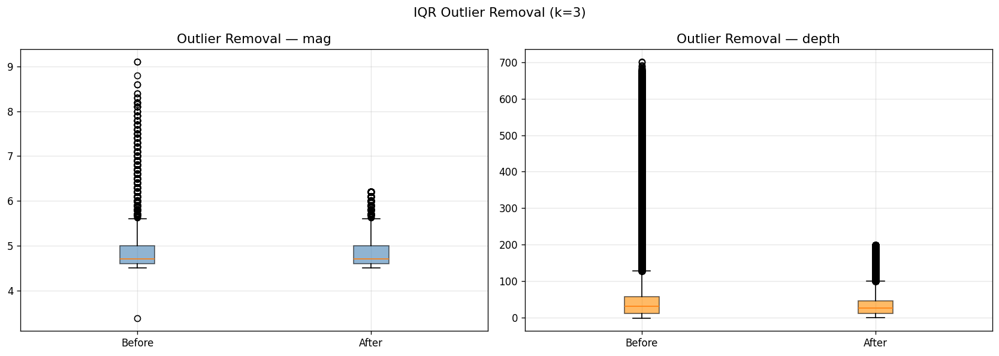

In [23]:
# ── 3. Outlier Detection & Removal (IQR k=3) ─────────────────────────────────
def iqr_bounds(series, k=3.0):
    Q1, Q3 = series.quantile(0.25), series.quantile(0.75)
    IQR = Q3 - Q1
    return Q1 - k * IQR, Q3 + k * IQR

mag_lo,   mag_hi   = iqr_bounds(df['mag'],   k=3.0)
depth_lo, depth_hi = iqr_bounds(df['depth'], k=3.0)
depth_lo = max(depth_lo, 0)

mask_outlier = (
    (df['mag']   < mag_lo)   | (df['mag']   > mag_hi) |
    (df['depth'] < depth_lo) | (df['depth'] > depth_hi)
)
print(f'Outliers flagged: {mask_outlier.sum()} / {len(df)}')

df['is_outlier'] = mask_outlier
df_clean = df[~mask_outlier].copy().reset_index(drop=True)
print(f'Clean shape: {df_clean.shape}')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, col, color in zip(axes, ['mag', 'depth'], ['steelblue', 'darkorange']):
    ax.boxplot([df[col].dropna(), df_clean[col].dropna()],
               labels=['Before', 'After'], patch_artist=True,
               boxprops=dict(facecolor=color, alpha=0.6))
    ax.set_title(f'Outlier Removal — {col}'); ax.grid(True, alpha=0.3)
plt.suptitle('IQR Outlier Removal (k=3)', fontsize=13)
plt.tight_layout()
save_fig('viz00_outlier_removal.png')
plt.show()

In [24]:
# ── 4. Temporal Feature Engineering ──────────────────────────────────────────
for dfc in [df, df_clean]:
    dfc['year']       = dfc['time'].dt.year
    dfc['month']      = dfc['time'].dt.month
    dfc['month_name'] = dfc['time'].dt.strftime('%b')
    dfc['dayofyear']  = dfc['time'].dt.dayofyear
    dfc['dayofweek']  = dfc['time'].dt.dayofweek
    dfc['hour']       = dfc['time'].dt.hour
    dfc['quarter']    = dfc['time'].dt.quarter
    dfc['week']       = dfc['time'].dt.isocalendar().week.astype(int)
    dfc['date']       = dfc['time'].dt.date
    dfc['energy_J']   = 10 ** (1.5 * dfc['mag'] + 4.8)

print('Temporal features added ✔')
df_clean[['year','month','hour','mag','depth','energy_J']].head(3)

Temporal features added ✔


,year,month,hour,mag,depth,energy_J
0,2000,1,1,4.5,10.0,3.548134e+11
1,2000,1,4,4.5,105.0,3.548134e+11
2,2000,1,5,5.1,54.3,2.818383e+12


In [25]:
# ── 5. Aggregation ────────────────────────────────────────────────────────────
agg_spec = dict(count=('mag','count'), mag_mean=('mag','mean'),
                mag_max=('mag','max'),  depth_mean=('depth','mean'),
                energy_sum=('energy_J','sum'))

daily   = df_clean.set_index('time').resample('D').agg(**agg_spec).fillna(0)
monthly = df_clean.set_index('time').resample('ME').agg(**agg_spec).fillna(0)
yearly  = df_clean.set_index('time').resample('YE').agg(**agg_spec).fillna(0)

ts_count = monthly['count'].clip(lower=0.01)   # must be positive for mult decomp
period   = 12 if len(ts_count) >= 24 else max(2, len(ts_count) // 2)

month_labels = ['Jan','Feb','Mar','Apr','May','Jun',
                'Jul','Aug','Sep','Oct','Nov','Dec']
print(f'Monthly rows: {len(monthly)}   Period: {period}')

Monthly rows: 306   Period: 12


  Saved → Images/viz01_raw_timeseries.png


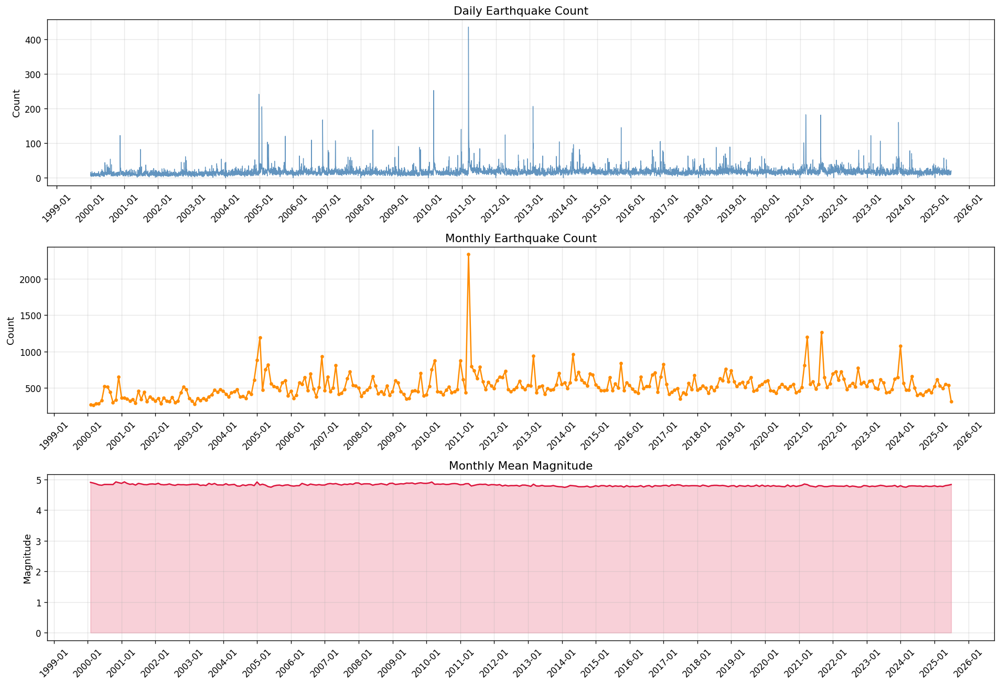

In [26]:
# ── VIZ 01 — Raw Time-Series ──────────────────────────────────────────────────
fig, axes = plt.subplots(3, 1, figsize=(16, 11))

axes[0].plot(daily.index, daily['count'], color='steelblue', lw=0.8, alpha=0.85)
axes[0].set_title('Daily Earthquake Count'); axes[0].set_ylabel('Count')

axes[1].plot(monthly.index, monthly['count'], 'darkorange', lw=1.5, marker='o', ms=3)
axes[1].set_title('Monthly Earthquake Count'); axes[1].set_ylabel('Count')

axes[2].plot(monthly.index, monthly['mag_mean'], 'crimson', lw=1.5)
axes[2].fill_between(monthly.index, monthly['mag_mean'], alpha=0.2, color='crimson')
axes[2].set_title('Monthly Mean Magnitude'); axes[2].set_ylabel('Magnitude')

for ax in axes:
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.xaxis.set_major_locator(mdates.YearLocator())
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
save_fig('viz01_raw_timeseries.png')
plt.show()

  Saved → Images/viz02_rolling_stats.png


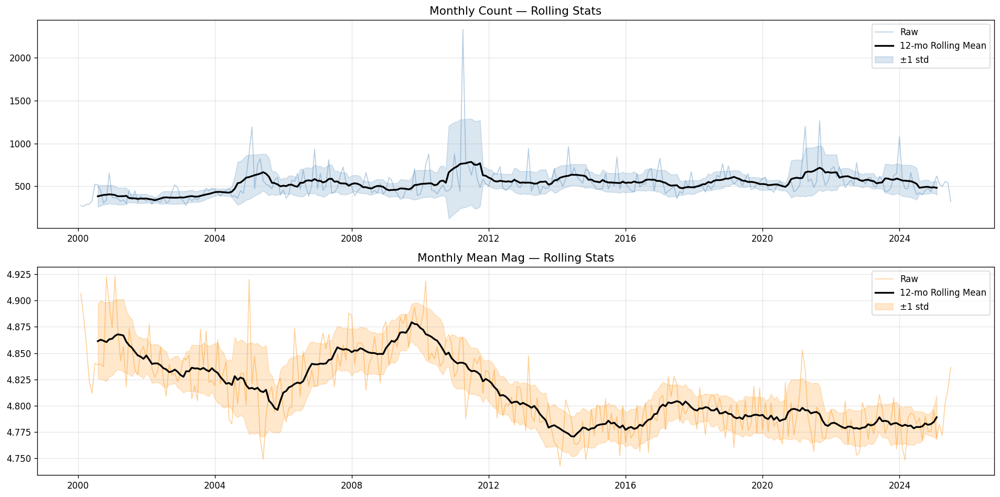

In [27]:
# ── VIZ 02 — Rolling Statistics ───────────────────────────────────────────────
roll_w = max(3, min(12, len(monthly) // 5))
fig, axes = plt.subplots(2, 1, figsize=(16, 8))
for ax, col, color, title in zip(
        axes, ['count','mag_mean'], ['steelblue','darkorange'],
        ['Monthly Count — Rolling Stats','Monthly Mean Mag — Rolling Stats']):
    s = monthly[col]
    rm  = s.rolling(roll_w, center=True).mean()
    rstd= s.rolling(roll_w, center=True).std()
    ax.plot(s.index, s, color=color, lw=1, alpha=0.4, label='Raw')
    ax.plot(s.index, rm, 'black', lw=2, label=f'{roll_w}-mo Rolling Mean')
    ax.fill_between(s.index, rm-rstd, rm+rstd, alpha=0.2, color=color, label='±1 std')
    ax.set_title(title); ax.legend(); ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz02_rolling_stats.png')
plt.show()

  Saved → Images/viz03_additive_decomp.png


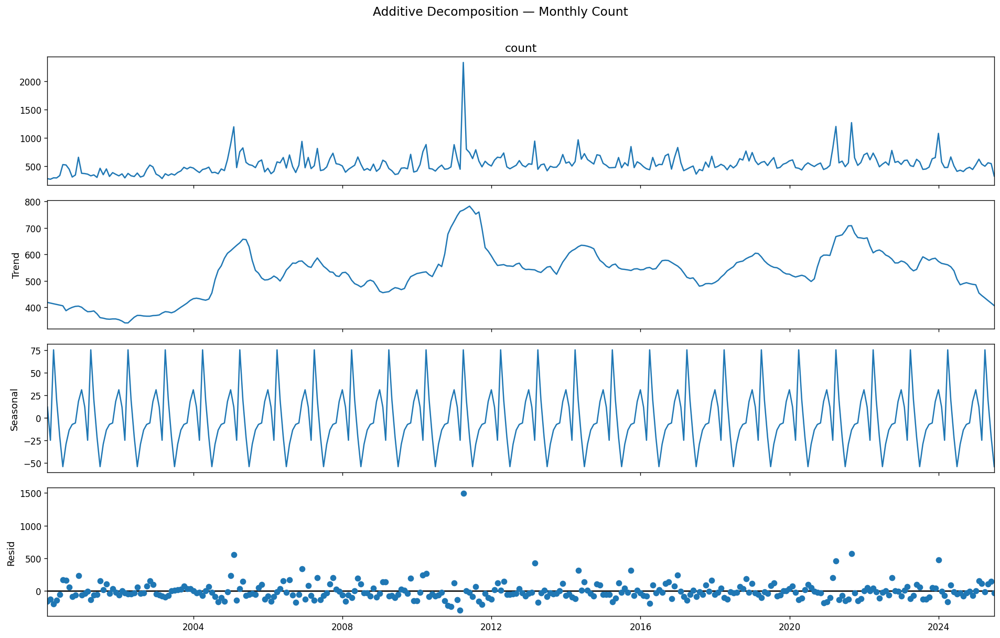

In [28]:
# ── VIZ 03 — Additive Decomposition ──────────────────────────────────────────
decomp_add = seasonal_decompose(
    ts_count, model='additive', period=period, extrapolate_trend='freq'
)
fig = decomp_add.plot()
fig.set_size_inches(16, 10)
fig.suptitle('Additive Decomposition — Monthly Count', fontsize=14, y=1.01)
plt.tight_layout()
save_fig('viz03_additive_decomp.png')
plt.show()

  Saved → Images/viz04_multiplicative_decomp.png


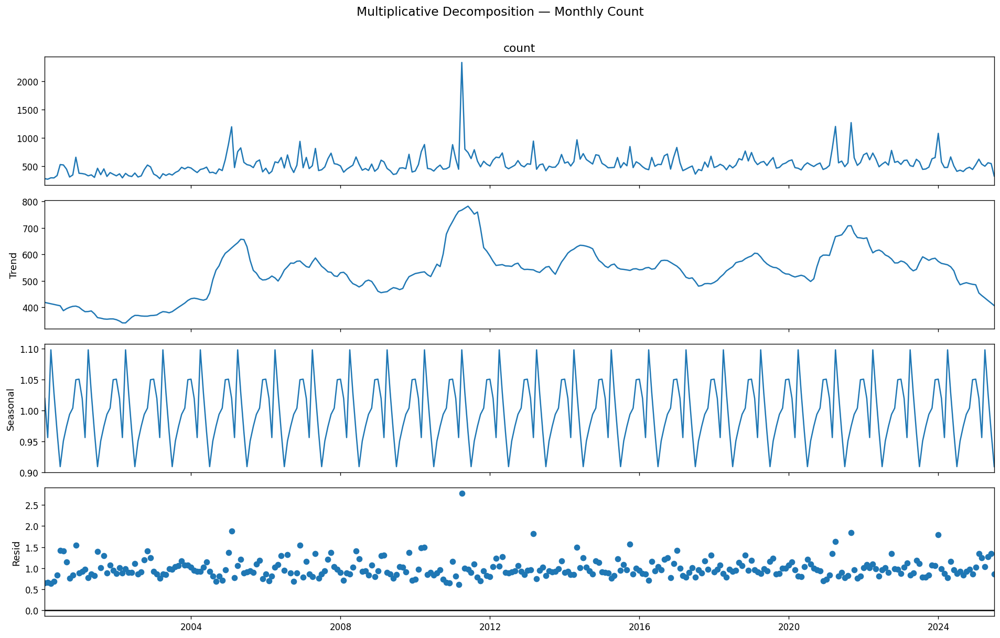

In [29]:
# ── VIZ 04 — Multiplicative Decomposition ────────────────────────────────────
decomp_mul = seasonal_decompose(
    ts_count, model='multiplicative', period=period, extrapolate_trend='freq'
)
fig = decomp_mul.plot()
fig.set_size_inches(16, 10)
fig.suptitle('Multiplicative Decomposition — Monthly Count', fontsize=14, y=1.01)
plt.tight_layout()
save_fig('viz04_multiplicative_decomp.png')
plt.show()

  Saved → Images/viz05_stl_decomp.png


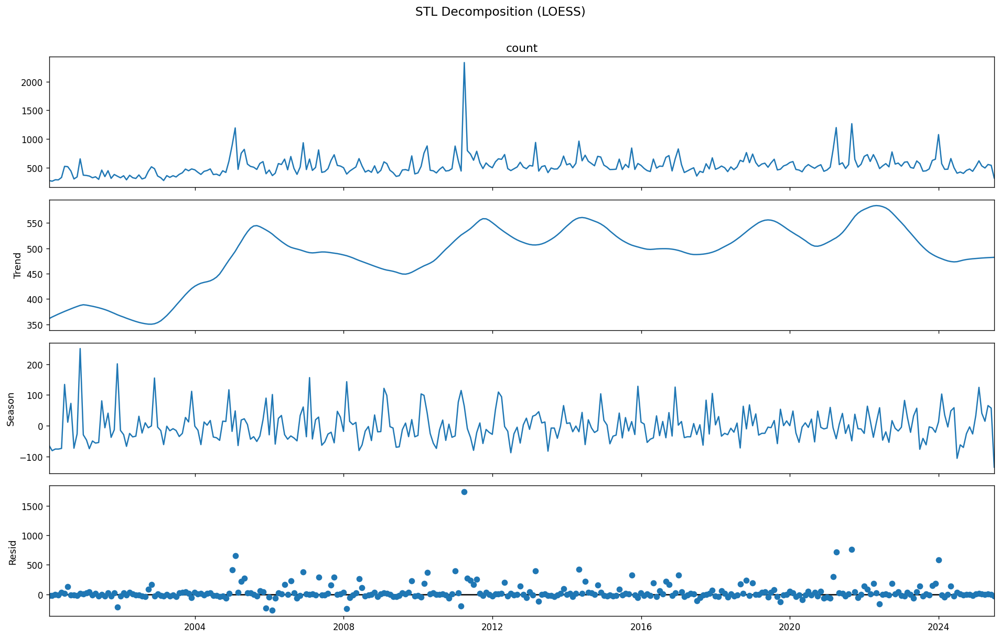

In [30]:
# ── VIZ 05 — STL Decomposition ───────────────────────────────────────────────
if len(ts_count) >= 2 * period:
    stl_obj = STL(ts_count, period=period, robust=True)
    stl_res = stl_obj.fit()
    stl_trend    = stl_res.trend
    stl_seasonal = stl_res.seasonal
    stl_resid    = stl_res.resid
    fig = stl_res.plot()
    fig.set_size_inches(16, 10)
    fig.suptitle('STL Decomposition (LOESS)', fontsize=14, y=1.01)
    plt.tight_layout()
    save_fig('viz05_stl_decomp.png')
    plt.show()
else:
    print(f'Not enough data for STL — using additive fallback.')
    stl_trend    = decomp_add.trend.bfill().ffill()     # ← fixed: no method= kwarg
    stl_seasonal = decomp_add.seasonal
    stl_resid    = decomp_add.resid.fillna(0)

  Saved → Images/viz06_detrending.png


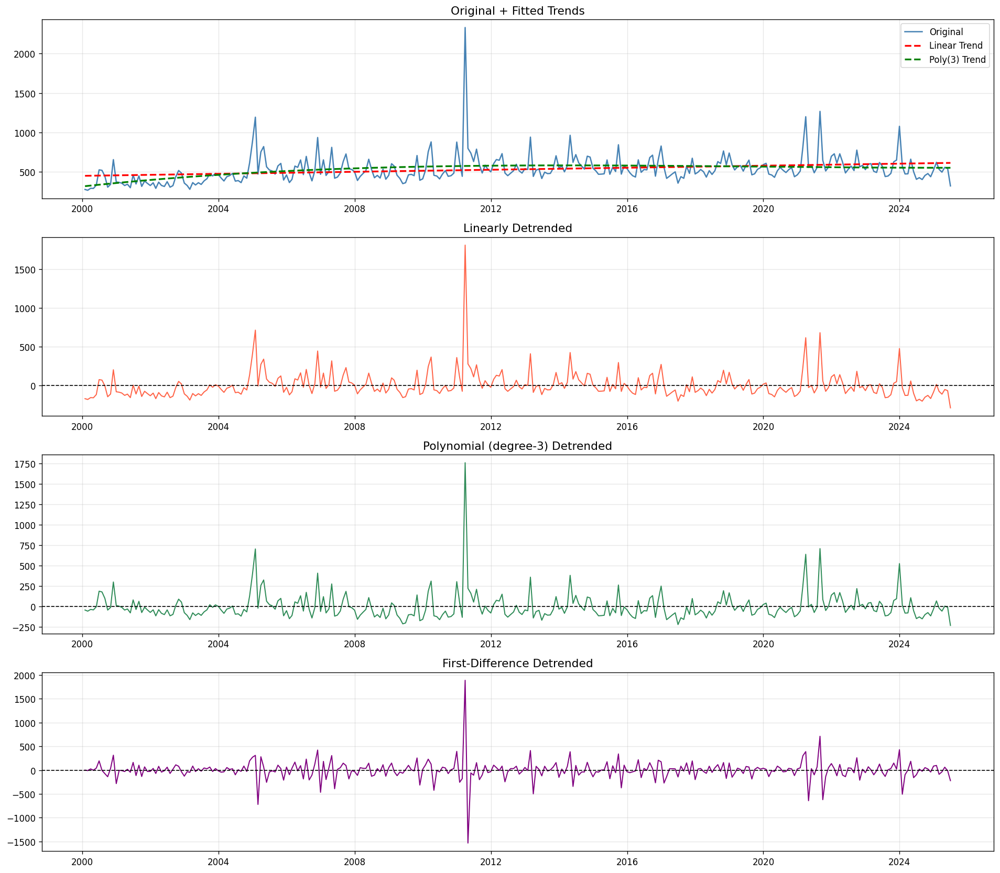

In [31]:
# ── VIZ 06 — Detrending ───────────────────────────────────────────────────────
t = np.arange(len(ts_count))
y = ts_count.values

lin_coeffs     = np.polyfit(t, y, 1)
lin_trend      = np.polyval(lin_coeffs, t)
detrended_lin  = y - lin_trend

poly_coeffs    = np.polyfit(t, y, 3)
poly_trend     = np.polyval(poly_coeffs, t)
detrended_poly = y - poly_trend

detrended_diff = np.diff(y, prepend=y[0])

# Also build the trend from decomp for later use
trend_component = decomp_add.trend.bfill().ffill()     # ← fixed

fig, axes = plt.subplots(4, 1, figsize=(16, 14))
axes[0].plot(ts_count.index, y, 'steelblue', lw=1.5, label='Original')
axes[0].plot(ts_count.index, lin_trend,  'r--', lw=2, label='Linear Trend')
axes[0].plot(ts_count.index, poly_trend, 'g--', lw=2, label='Poly(3) Trend')
axes[0].set_title('Original + Fitted Trends'); axes[0].legend()
axes[1].plot(ts_count.index, detrended_lin,  'tomato',   lw=1.2)
axes[1].axhline(0, color='black', ls='--', lw=1)
axes[1].set_title('Linearly Detrended')
axes[2].plot(ts_count.index, detrended_poly, 'seagreen', lw=1.2)
axes[2].axhline(0, color='black', ls='--', lw=1)
axes[2].set_title('Polynomial (degree-3) Detrended')
axes[3].plot(ts_count.index, detrended_diff, 'purple',   lw=1.2)
axes[3].axhline(0, color='black', ls='--', lw=1)
axes[3].set_title('First-Difference Detrended')
for ax in axes: ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz06_detrending.png')
plt.show()

  Saved → Images/viz07_deseasonalised.png


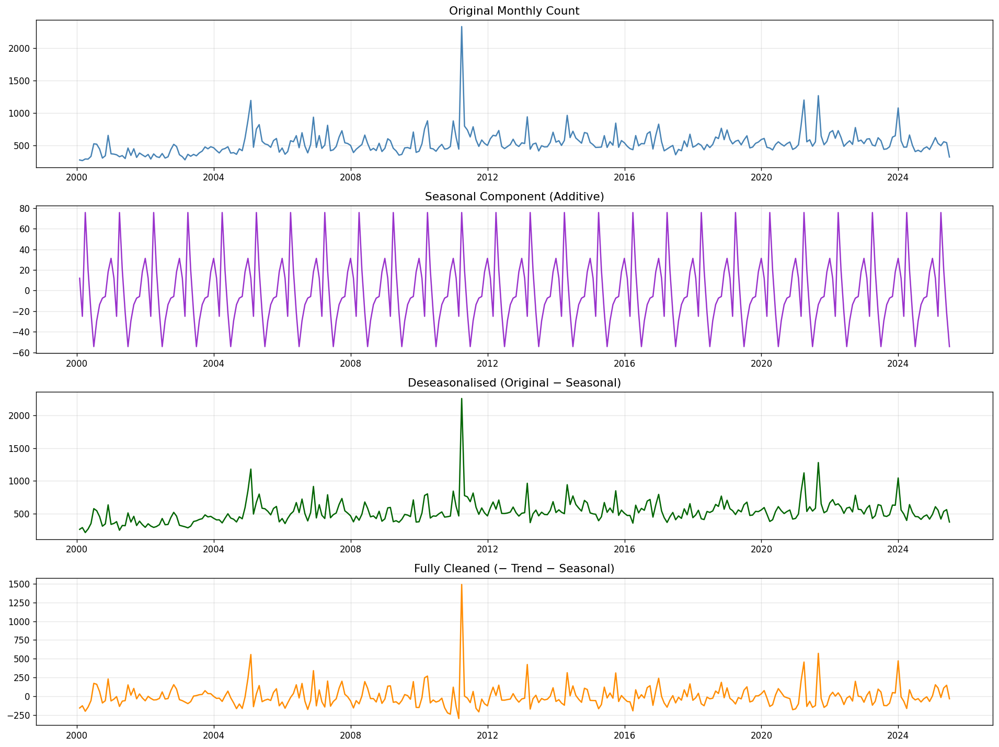

In [32]:
# ── VIZ 07 — Deseasonalization ────────────────────────────────────────────────
seasonal_component  = decomp_add.seasonal
residual_component  = decomp_add.resid.fillna(0)
deseasonalised      = ts_count - seasonal_component
detrended_deseason  = deseasonalised - trend_component

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
for ax, (series, color, title) in zip(axes, [
    (ts_count,             'steelblue',  'Original Monthly Count'),
    (seasonal_component,   'darkorchid', 'Seasonal Component (Additive)'),
    (deseasonalised,       'darkgreen',  'Deseasonalised (Original − Seasonal)'),
    (detrended_deseason,   'darkorange', 'Fully Cleaned (− Trend − Seasonal)'),
]):
    ax.plot(series.index, series, color=color, lw=1.5)
    ax.set_title(title); ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz07_deseasonalised.png')
plt.show()

  Saved → Images/viz08_seasonal_plots.png


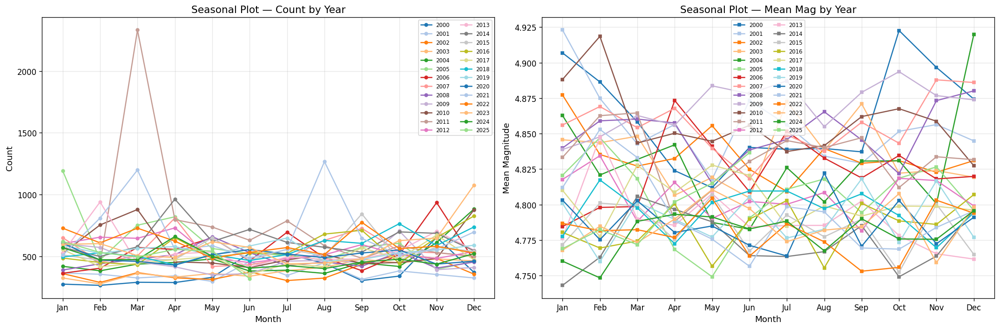

  Saved → Images/viz09_seasonal_subseries.png


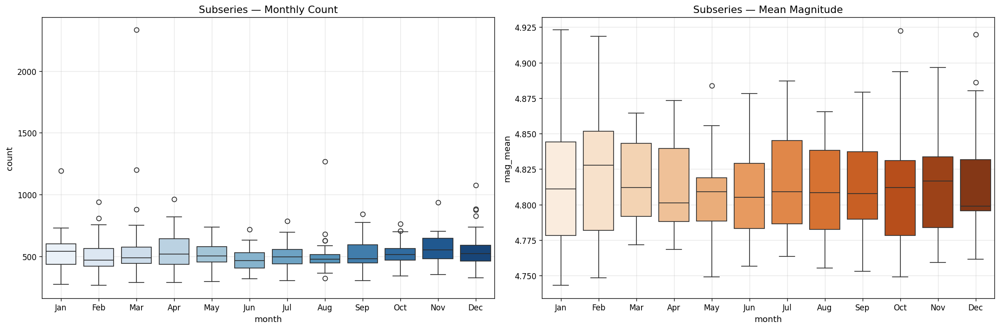

In [33]:
# ── VIZ 08 & 09 — Seasonal Plots ─────────────────────────────────────────────
df_mp   = df_clean.groupby(['year','month']).agg(
    count=('mag','count'), mag_mean=('mag','mean')
).reset_index()
years   = sorted(df_mp['year'].unique())
palette = sns.color_palette('tab20', n_colors=max(len(years), 1))

# VIZ 08 — Line seasonal plot
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
for i, yr in enumerate(years):
    sub = df_mp[df_mp['year'] == yr]
    axes[0].plot(sub['month'], sub['count'],    marker='o', ms=4, label=str(yr), color=palette[i % 20])
    axes[1].plot(sub['month'], sub['mag_mean'], marker='s', ms=4, label=str(yr), color=palette[i % 20])
for ax, ylabel, title in zip(axes,
        ['Count','Mean Magnitude'],
        ['Seasonal Plot — Count by Year','Seasonal Plot — Mean Mag by Year']):
    ax.set_xticks(range(1,13)); ax.set_xticklabels(month_labels)
    ax.set_xlabel('Month'); ax.set_ylabel(ylabel); ax.set_title(title)
    ax.grid(True, alpha=0.3); ax.legend(fontsize=7, ncol=2)
plt.tight_layout()
save_fig('viz08_seasonal_plots.png')
plt.show()

# VIZ 09 — Subseries boxplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sns.boxplot(data=df_mp, x='month', y='count',    palette='Blues',   ax=axes[0])
sns.boxplot(data=df_mp, x='month', y='mag_mean', palette='Oranges', ax=axes[1])
for ax, title in zip(axes,
        ['Subseries — Monthly Count','Subseries — Mean Magnitude']):
    ax.set_xticks(range(0,12)); ax.set_xticklabels(month_labels)
    ax.set_title(title); ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz09_seasonal_subseries.png')
plt.show()

  Saved → Images/viz10_lag_plots.png


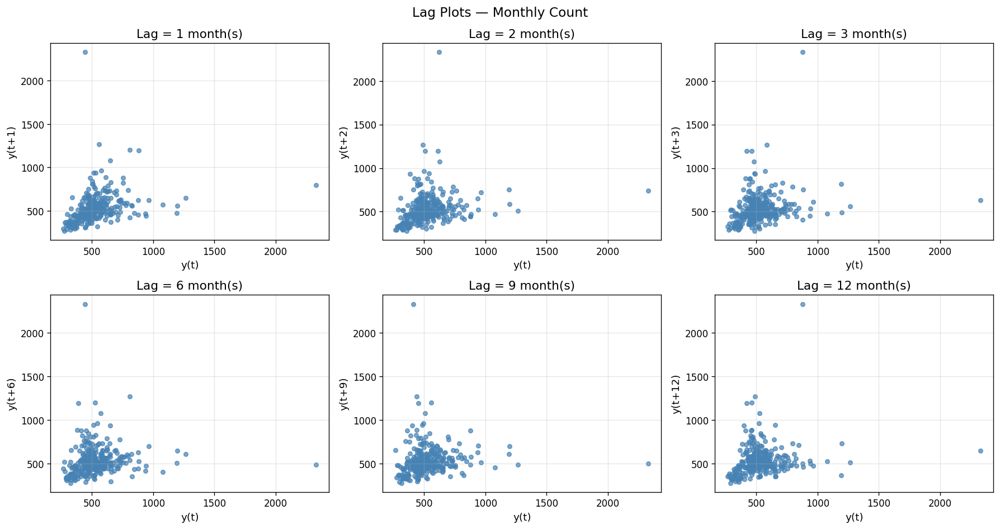

In [34]:
# ── VIZ 10 — Lag Plots ────────────────────────────────────────────────────────
lags = [1, 2, 3, 6, 9, 12]
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
for ax, lag in zip(axes.flatten(), lags):
    lag_plot(ts_count, lag=lag, ax=ax, c='steelblue', alpha=0.7, s=20)
    ax.set_title(f'Lag = {lag} month(s)')
    ax.set_xlabel('y(t)'); ax.set_ylabel(f'y(t+{lag})')
    ax.grid(True, alpha=0.3)
plt.suptitle('Lag Plots — Monthly Count', fontsize=14)
plt.tight_layout()
save_fig('viz10_lag_plots.png')
plt.show()

  Saved → Images/viz11_acf_pacf.png


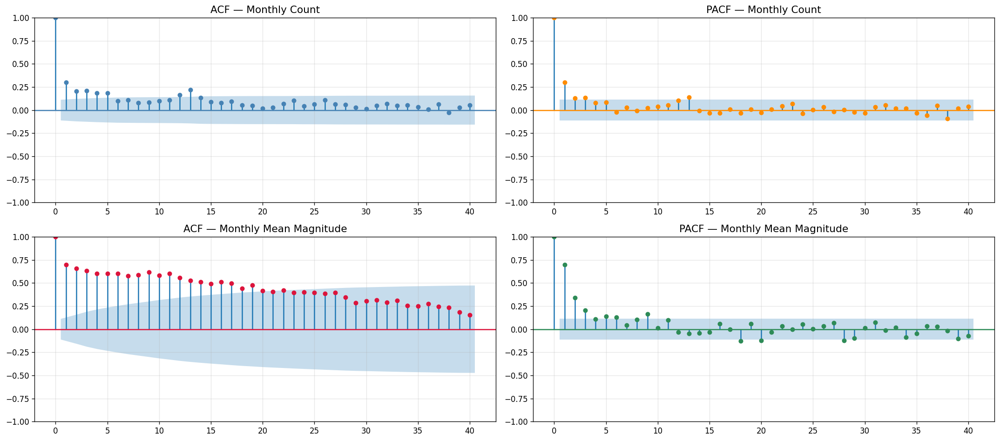

  Saved → Images/viz12_acf_residuals.png


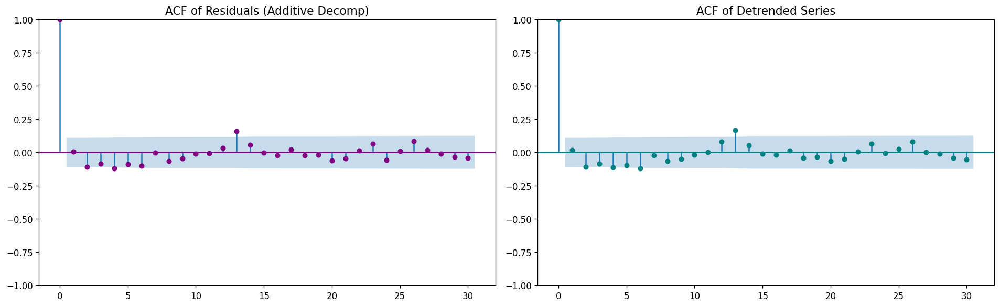

In [35]:
# ── VIZ 11 & 12 — ACF / PACF ─────────────────────────────────────────────────
max_lags = min(40, len(ts_count) // 2 - 1)

fig, axes = plt.subplots(2, 2, figsize=(18, 8))
plot_acf( ts_count,           lags=max_lags, ax=axes[0,0], color='steelblue')
axes[0,0].set_title('ACF — Monthly Count')
plot_pacf(ts_count,           lags=max_lags, ax=axes[0,1], method='ywm', color='darkorange')
axes[0,1].set_title('PACF — Monthly Count')
plot_acf( monthly['mag_mean'],lags=max_lags, ax=axes[1,0], color='crimson')
axes[1,0].set_title('ACF — Monthly Mean Magnitude')
plot_pacf(monthly['mag_mean'],lags=max_lags, ax=axes[1,1], method='ywm', color='seagreen')
axes[1,1].set_title('PACF — Monthly Mean Magnitude')
for ax in axes.flatten(): ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz11_acf_pacf.png')
plt.show()

# ACF of residuals & detrended series
residuals        = decomp_add.resid.dropna()
detrended_series = (ts_count - trend_component).dropna()  # ← uses .bfill().ffill(), no error
max_lag_r = min(30, len(residuals) // 2 - 1)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
plot_acf(residuals,        lags=max_lag_r, ax=axes[0], color='purple')
axes[0].set_title('ACF of Residuals (Additive Decomp)')
plot_acf(detrended_series, lags=max_lag_r, ax=axes[1], color='teal')
axes[1].set_title('ACF of Detrended Series')
plt.tight_layout()
save_fig('viz12_acf_residuals.png')
plt.show()

  Saved → Images/viz13_smoothing.png


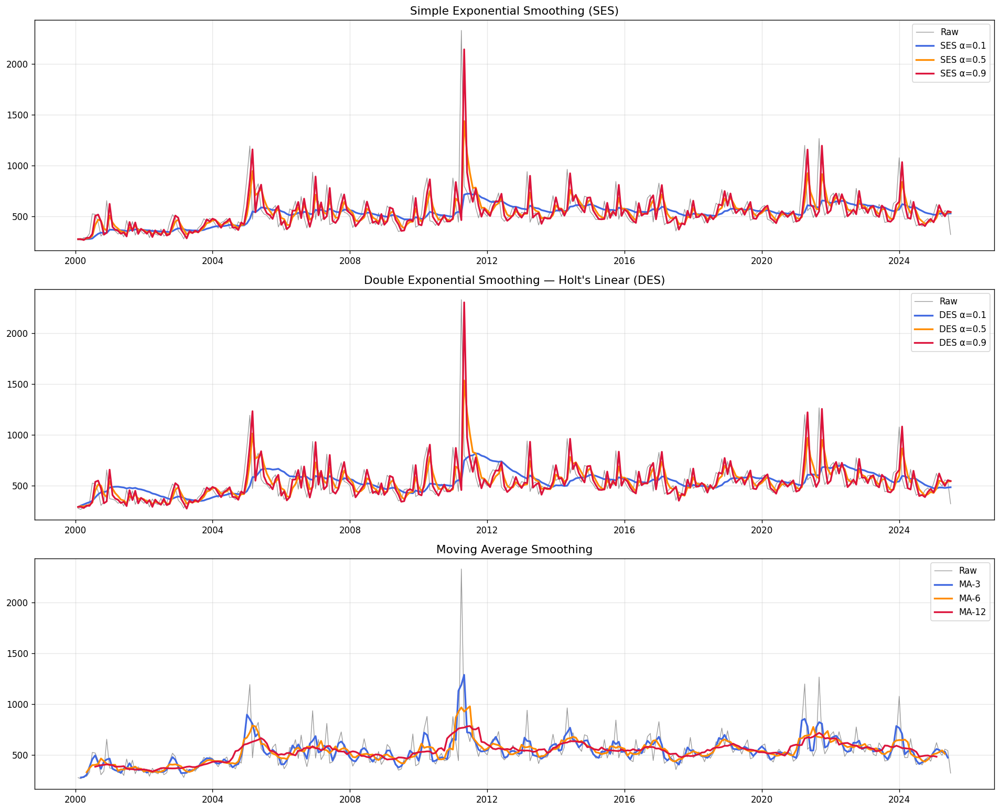

In [36]:
# ── VIZ 13 — Time-Series Smoothing ───────────────────────────────────────────
# FIX: ExponentialSmoothing with trend='add' requires smoothing_trend
# when optimized=False; also use initialization_method='estimated'.
alpha_vals = [0.1, 0.5, 0.9]
colors_s   = ['royalblue', 'darkorange', 'crimson']

fig, axes = plt.subplots(3, 1, figsize=(16, 13))

# Panel 1 — Simple Exponential Smoothing
ax = axes[0]
ax.plot(ts_count.index, ts_count, color='gray', lw=0.8, alpha=0.8, label='Raw')
for alpha, c in zip(alpha_vals, colors_s):
    ses = SimpleExpSmoothing(
        ts_count, initialization_method='estimated'
    ).fit(smoothing_level=alpha, optimized=False)
    ax.plot(ts_count.index, ses.fittedvalues, lw=2, color=c, label=f'SES α={alpha}')
ax.set_title('Simple Exponential Smoothing (SES)')
ax.legend(); ax.grid(True, alpha=0.3)

# Panel 2 — Double Exponential Smoothing (Holt's Linear)
# Must supply both smoothing_level AND smoothing_trend when optimized=False
ax = axes[1]
ax.plot(ts_count.index, ts_count, color='gray', lw=0.8, alpha=0.8, label='Raw')
for alpha, c in zip(alpha_vals, colors_s):
    des = ExponentialSmoothing(
        ts_count, trend='add', initialization_method='estimated'
    ).fit(
        smoothing_level=alpha,
        smoothing_trend=0.1,      # ← required when optimized=False with trend
        optimized=False
    )
    ax.plot(ts_count.index, des.fittedvalues, lw=2, color=c, label=f'DES α={alpha}')
ax.set_title("Double Exponential Smoothing — Holt's Linear (DES)")
ax.legend(); ax.grid(True, alpha=0.3)

# Panel 3 — Moving Averages
ax = axes[2]
ax.plot(ts_count.index, ts_count, color='gray', lw=0.8, alpha=0.8, label='Raw')
for w, c in zip([3, 6, 12], colors_s):
    ax.plot(ts_count.index, ts_count.rolling(w, center=True).mean(),
            lw=2, color=c, label=f'MA-{w}')
ax.set_title('Moving Average Smoothing')
ax.legend(); ax.grid(True, alpha=0.3)

plt.tight_layout()
save_fig('viz13_smoothing.png')
plt.show()

In [37]:
# ── Stationarity Tests ────────────────────────────────────────────────────────
def stationarity_report(series, name):
    print(f'\n═══ {name} ═══')
    # Convert to pandas Series if numpy array, then drop NaN
    if isinstance(series, np.ndarray):
        series = pd.Series(series)
    series = series.dropna()
    adf = adfuller(series, autolag='AIC')
    print(f'  ADF  stat={adf[0]:8.4f}  p={adf[1]:.4f}  {"STATIONARY ✔" if adf[1]<0.05 else "NON-STATIONARY ✘"}')
    try:
        kp = kpss(series, regression='c', nlags='auto')
        print(f'  KPSS stat={kp[0]:8.4f}  p={kp[1]:.4f}  {"NON-STATIONARY ✘" if kp[1]<0.05 else "STATIONARY ✔"}')
    except Exception as e:
        print(f'  KPSS: {e}')

stationarity_report(ts_count,           'Monthly Count (raw)')
stationarity_report(monthly['mag_mean'],'Monthly Mean Magnitude')
stationarity_report(detrended_lin,      'Linearly Detrended Count')
stationarity_report(residuals,          'Additive Residuals')
stationarity_report(deseasonalised,     'Deseasonalised Count')


═══ Monthly Count (raw) ═══
  ADF  stat= -7.1028  p=0.0000  STATIONARY ✔
  KPSS stat=  0.9417  p=0.0100  NON-STATIONARY ✘

═══ Monthly Mean Magnitude ═══
  ADF  stat= -1.8602  p=0.3510  NON-STATIONARY ✘
  KPSS stat=  1.8204  p=0.0100  NON-STATIONARY ✘

═══ Linearly Detrended Count ═══
  ADF  stat= -7.5700  p=0.0000  STATIONARY ✔
  KPSS stat=  0.2495  p=0.1000  STATIONARY ✔

═══ Additive Residuals ═══
  ADF  stat= -9.9363  p=0.0000  STATIONARY ✔
  KPSS stat=  0.0865  p=0.1000  STATIONARY ✔

═══ Deseasonalised Count ═══
  ADF  stat= -5.2554  p=0.0000  STATIONARY ✔
  KPSS stat=  0.9475  p=0.0100  NON-STATIONARY ✘


  Saved → Images/viz14_heatmaps.png


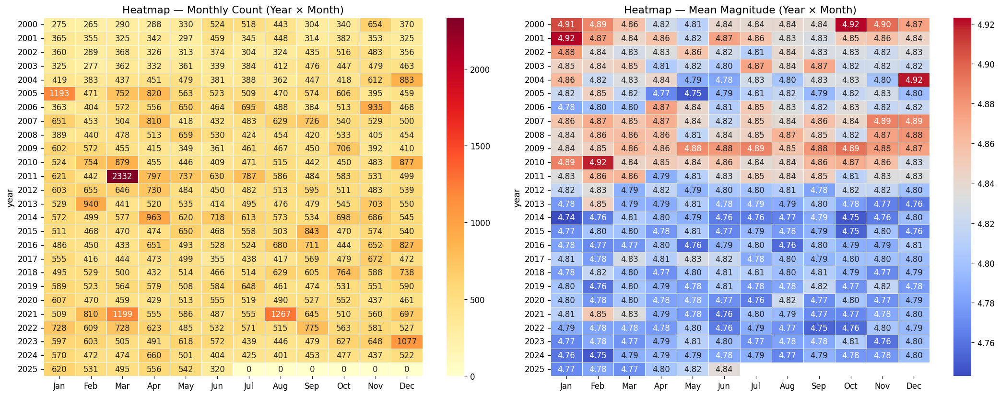

  Saved → Images/viz15_corr_heatmap.png


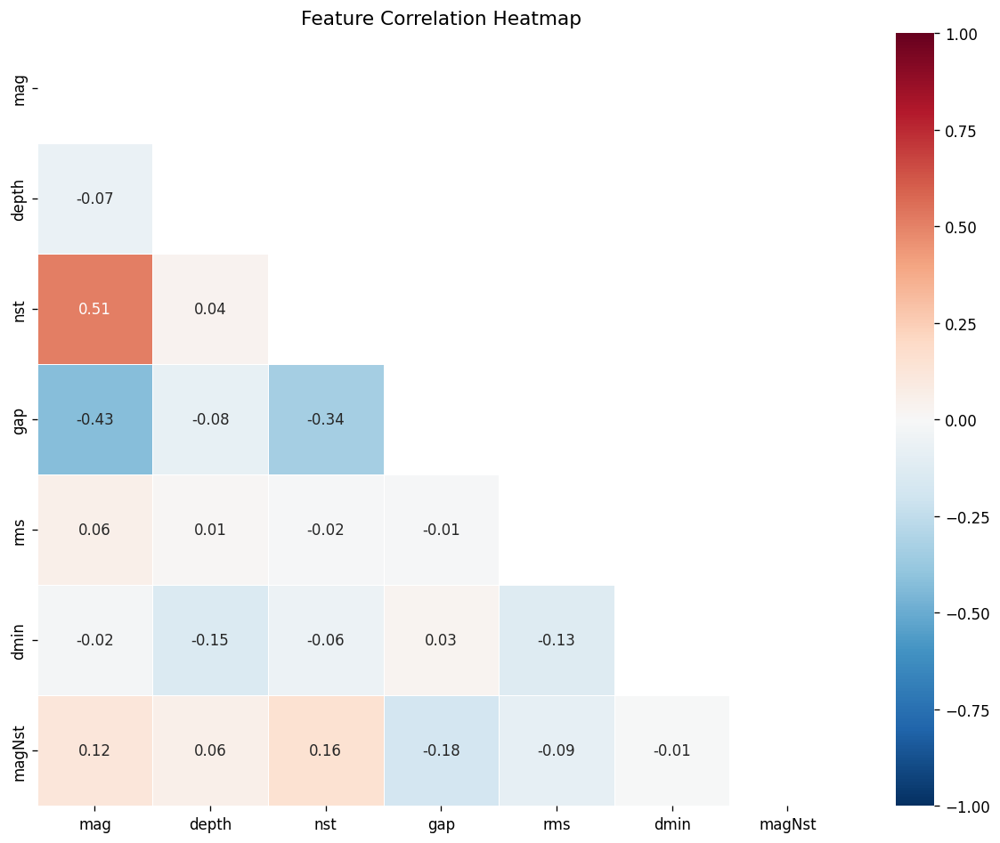

In [38]:
# ── VIZ 14 & 15 — Heatmaps ───────────────────────────────────────────────────
pivot_count = df_mp.pivot_table(values='count',    index='year', columns='month', fill_value=0)
pivot_mag   = df_mp.pivot_table(values='mag_mean', index='year', columns='month', fill_value=np.nan)
ml = month_labels[:12]
pivot_count.columns = ml[:pivot_count.shape[1]]
pivot_mag.columns   = ml[:pivot_mag.shape[1]]

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
sns.heatmap(pivot_count, cmap='YlOrRd', annot=True, fmt='.0f', linewidths=0.5, ax=axes[0])
axes[0].set_title('Heatmap — Monthly Count (Year × Month)')
sns.heatmap(pivot_mag, cmap='coolwarm', annot=True, fmt='.2f', linewidths=0.5, ax=axes[1])
axes[1].set_title('Heatmap — Mean Magnitude (Year × Month)')
plt.tight_layout()
save_fig('viz14_heatmaps.png')
plt.show()

num_cols = [c for c in ['mag','depth','nst','gap','rms','dmin','magNst'] if c in df_clean.columns]
corr = df_clean[num_cols].corr()
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr, mask=np.triu(np.ones_like(corr, dtype=bool)),
            annot=True, fmt='.2f', cmap='RdBu_r', center=0,
            linewidths=0.5, ax=ax, vmin=-1, vmax=1)
ax.set_title('Feature Correlation Heatmap')
plt.tight_layout()
save_fig('viz15_corr_heatmap.png')
plt.show()

  Saved → Images/viz16_kde.png


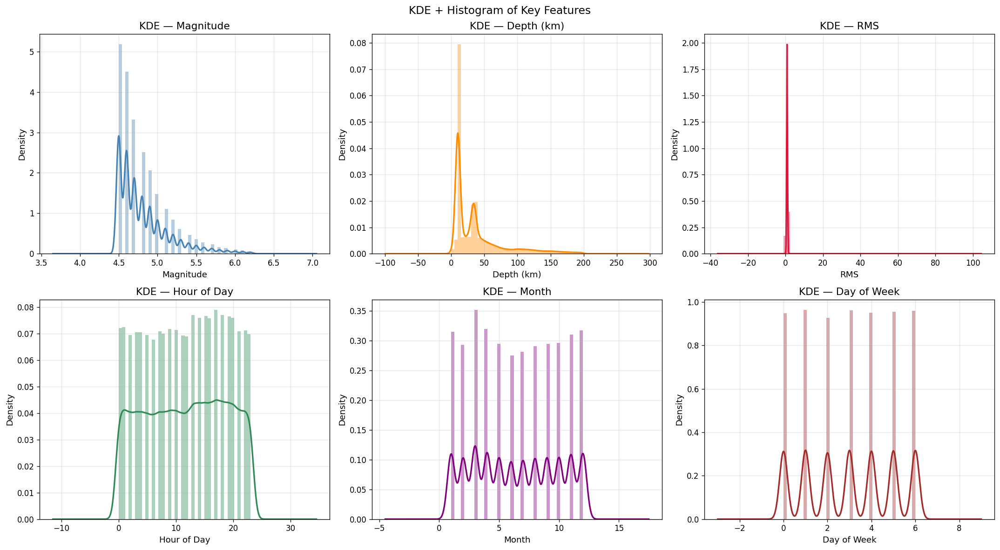

In [39]:
# ── VIZ 16 — KDE Plots ───────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
for ax, (col, label, color) in zip(axes.flatten(), [
    ('mag','Magnitude','steelblue'), ('depth','Depth (km)','darkorange'),
    ('rms','RMS','crimson'),         ('hour','Hour of Day','seagreen'),
    ('month','Month','purple'),      ('dayofweek','Day of Week','brown')]):
    if col in df_clean.columns:
        data = df_clean[col].dropna()
        ax.hist(data, bins=40, density=True, alpha=0.4, color=color)
        data.plot.kde(ax=ax, color=color, lw=2)
        ax.set_title(f'KDE — {label}')
        ax.set_xlabel(label); ax.set_ylabel('Density'); ax.grid(True, alpha=0.3)
plt.suptitle('KDE + Histogram of Key Features', fontsize=14)
plt.tight_layout()
save_fig('viz16_kde.png')
plt.show()

  Saved → Images/viz17_pairplot.png


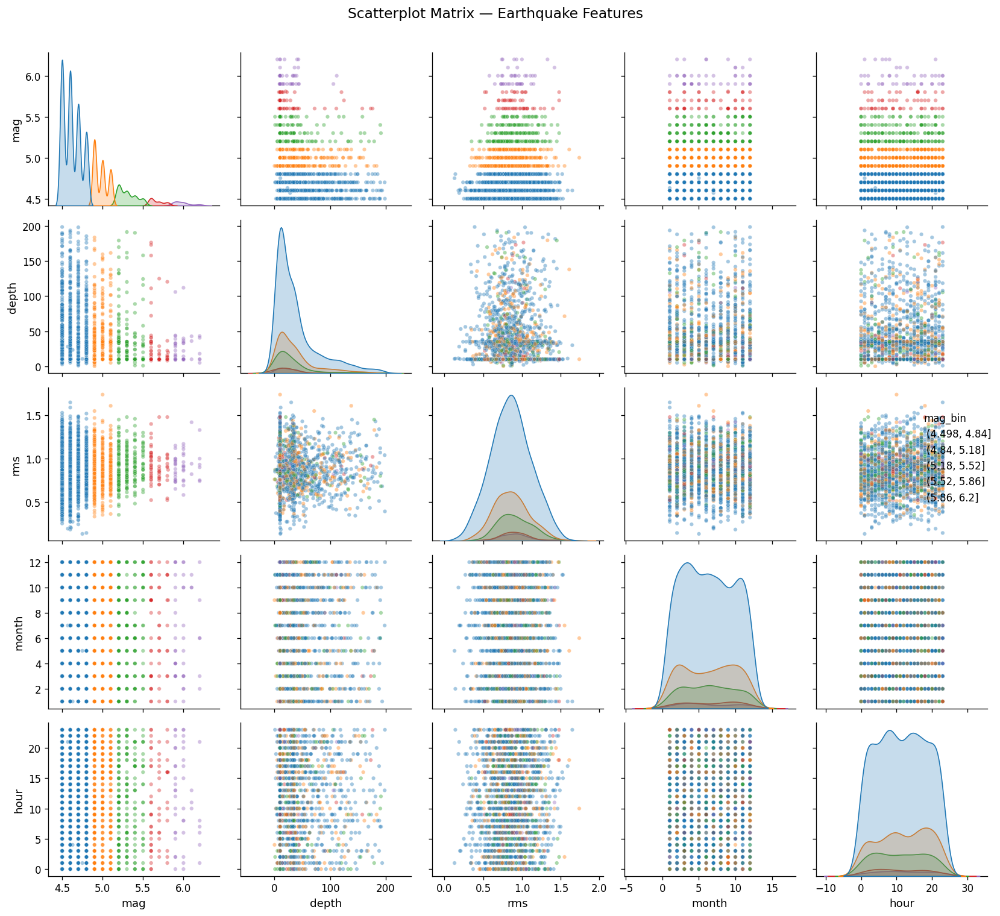

In [40]:
# ── VIZ 17 — Scatterplot Matrix ───────────────────────────────────────────────
pair_cols = [c for c in ['mag','depth','rms','month','hour'] if c in df_clean.columns]
sample = df_clean[pair_cols].dropna().sample(min(2000, len(df_clean)), random_state=42).copy()
sample['mag_bin'] = pd.cut(sample['mag'], bins=5)
g = sns.pairplot(sample, vars=pair_cols, hue='mag_bin',
                 plot_kws={'alpha':0.4,'s':15}, diag_kind='kde', palette='tab10')
g.fig.suptitle('Scatterplot Matrix — Earthquake Features', y=1.01, fontsize=14)
plt.tight_layout()
save_fig('viz17_pairplot.png')
plt.show()

  Saved → Images/viz18_tsne.png


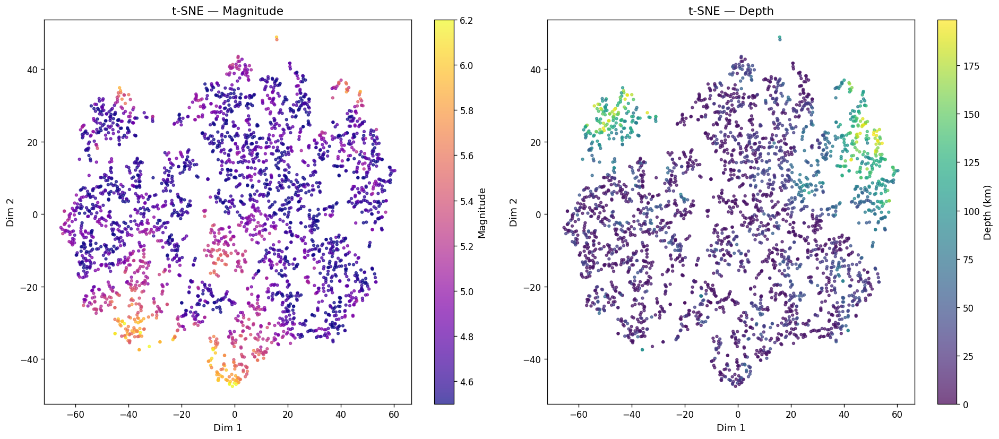

In [42]:
# ── VIZ 18 — t-SNE ────────────────────────────────────────────────────────────
tsne_cols = [c for c in ['mag','depth','latitude','longitude','rms','month','hour']
             if c in df_clean.columns]
tsne_sample = df_clean[tsne_cols].dropna().sample(min(3000, len(df_clean)), random_state=42)
X_scaled    = StandardScaler().fit_transform(tsne_sample)
X_tsne      = TSNE(n_components=2, perplexity=30, random_state=42, max_iter=1000).fit_transform(X_scaled)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
sc  = axes[0].scatter(X_tsne[:,0], X_tsne[:,1], c=tsne_sample['mag'],   cmap='plasma',  s=8, alpha=0.7)
sc2 = axes[1].scatter(X_tsne[:,0], X_tsne[:,1], c=tsne_sample['depth'], cmap='viridis', s=8, alpha=0.7)
plt.colorbar(sc,  ax=axes[0], label='Magnitude')
plt.colorbar(sc2, ax=axes[1], label='Depth (km)')
for ax, t in zip(axes, ['t-SNE — Magnitude','t-SNE — Depth']):
    ax.set_title(t); ax.set_xlabel('Dim 1'); ax.set_ylabel('Dim 2')
plt.tight_layout()
save_fig('viz18_tsne.png')
plt.show()

In [43]:
# ── Spatial Setup ─────────────────────────────────────────────────────────────
import geopandas as gpd
from libpysal.weights import KNN
from esda.moran import Moran, Moran_Local
from esda.geary import Geary
from esda.join_counts import Join_Counts
from esda.getisord import G_Local
from splot.esda import moran_scatterplot

gdf = gpd.GeoDataFrame(
    df_clean.copy(),
    geometry=gpd.points_from_xy(df_clean['longitude'], df_clean['latitude']),
    crs='EPSG:4326'
)
gdf_s = gdf.sample(min(3000, len(gdf)), random_state=42).copy().reset_index(drop=True)

w8 = KNN.from_dataframe(gdf_s, k=8); w8.transform = 'R'
w4 = KNN.from_dataframe(gdf_s, k=4); w4.transform = 'B'
y_mag = gdf_s['mag'].values

try:
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
except:
    world = None

print(f'Spatial sample: {len(gdf_s)} points')

Spatial sample: 3000 points


Moran's I=0.0439  p=0.0010  z=5.1396
  Saved → Images/viz19_morans_i.png


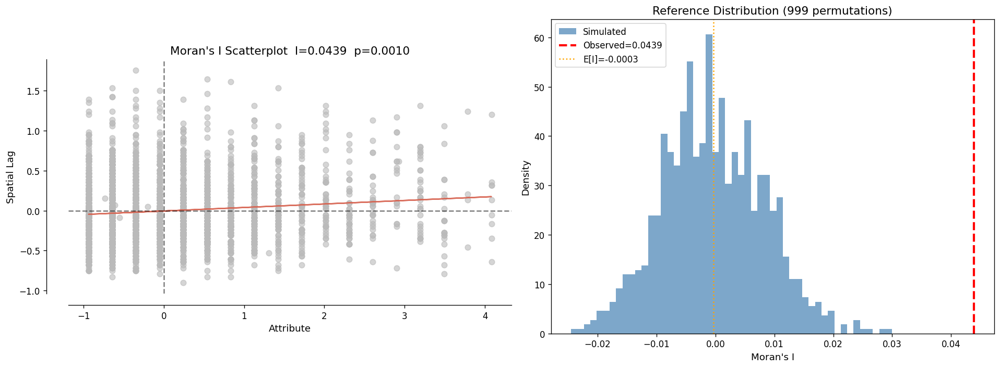

In [44]:
# ── VIZ 19 — Global Moran's I ─────────────────────────────────────────────────
moran_global = Moran(y_mag, w8)
print(f"Moran's I={moran_global.I:.4f}  p={moran_global.p_sim:.4f}  z={moran_global.z_sim:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
moran_scatterplot(moran_global, ax=axes[0], aspect_equal=True)
axes[0].set_title(f"Moran's I Scatterplot  I={moran_global.I:.4f}  p={moran_global.p_sim:.4f}")

axes[1].hist(moran_global.sim, bins=50, density=True, color='steelblue', alpha=0.7, label='Simulated')
axes[1].axvline(moran_global.I,  color='red',    lw=2.5, ls='--', label=f'Observed={moran_global.I:.4f}')
axes[1].axvline(moran_global.EI, color='orange', lw=1.5, ls=':',  label=f'E[I]={moran_global.EI:.4f}')
axes[1].set_xlabel("Moran's I"); axes[1].set_ylabel('Density')
axes[1].set_title('Reference Distribution (999 permutations)')
axes[1].legend()
plt.tight_layout()
save_fig('viz19_morans_i.png')
plt.show()

Geary's C=0.9424  p=0.0010  (C<1 → positive autocorr)
  Saved → Images/viz20_gearys_c.png


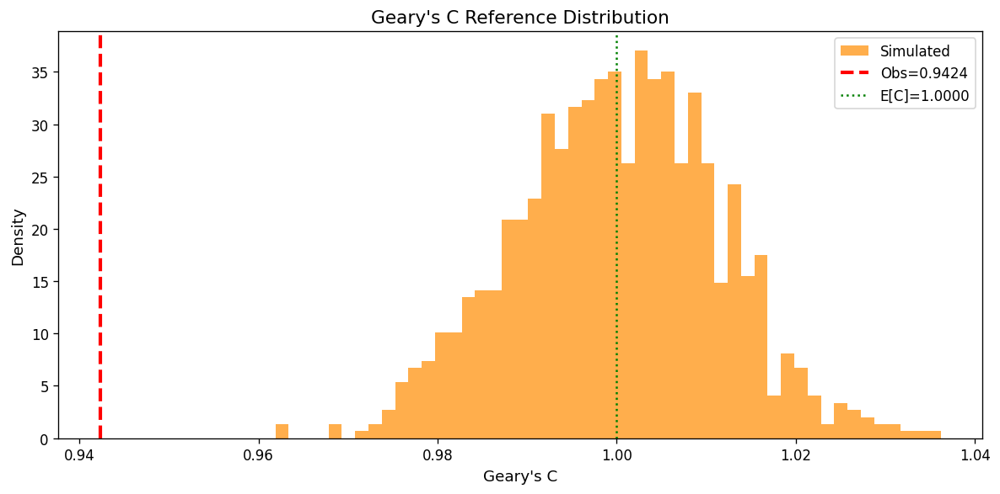

In [45]:
# ── VIZ 20 — Geary's C ────────────────────────────────────────────────────────
geary_global = Geary(y_mag, w8)
print(f"Geary's C={geary_global.C:.4f}  p={geary_global.p_sim:.4f}  (C<1 → positive autocorr)")

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(geary_global.sim, bins=50, density=True, color='darkorange', alpha=0.7, label='Simulated')
ax.axvline(geary_global.C,  color='red',   lw=2.5, ls='--', label=f'Obs={geary_global.C:.4f}')
ax.axvline(geary_global.EC, color='green', lw=1.5, ls=':',  label=f'E[C]={geary_global.EC:.4f}')
ax.set_xlabel("Geary's C"); ax.set_ylabel('Density')
ax.set_title("Geary's C Reference Distribution")
ax.legend()
plt.tight_layout()
save_fig('viz20_gearys_c.png')
plt.show()

lisa_label
Not Sig.     2603
Low-Low       127
Low-High      112
High-High      99
High-Low       59
Name: count, dtype: int64
  Saved → Images/viz21_lisa_world.png


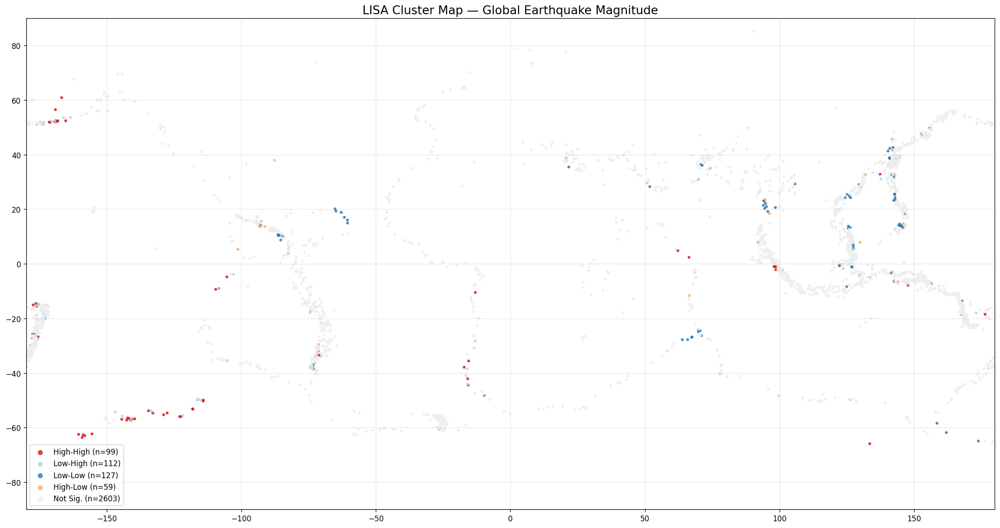

In [46]:
# ── VIZ 21 — LISA Cluster World Map ──────────────────────────────────────────
moran_local = Moran_Local(y_mag, w8, transformation='R', permutations=999, seed=42)

gdf_s['lisa_q']   = moran_local.q
gdf_s['lisa_p']   = moran_local.p_sim
gdf_s['lisa_sig'] = moran_local.p_sim < 0.05

quad_labels = {1:'High-High',2:'Low-High',3:'Low-Low',4:'High-Low',0:'Not Sig.'}
quad_colors = {1:'#d7191c',  2:'#abd9e9', 3:'#2c7bb6',4:'#fdae61', 0:'#eeeeee'}
gdf_s['lisa_label'] = gdf_s.apply(
    lambda r: quad_labels[r['lisa_q']] if r['lisa_sig'] else 'Not Sig.', axis=1)
print(gdf_s['lisa_label'].value_counts())

fig, ax = plt.subplots(figsize=(20, 10))
if world is not None: world.plot(ax=ax, color='#f5f5f5', edgecolor='#ccc', linewidth=0.4)
for qid, color in quad_colors.items():
    name = quad_labels[qid]
    sub  = gdf_s[gdf_s['lisa_label'] == name]
    if len(sub): sub.plot(ax=ax, color=color, markersize=8, alpha=0.8, label=f'{name} (n={len(sub)})')
ax.set_xlim(-180,180); ax.set_ylim(-90,90)
ax.set_title('LISA Cluster Map — Global Earthquake Magnitude', fontsize=16)
ax.legend(loc='lower left', fontsize=10, markerscale=2); ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz21_lisa_world.png')
plt.show()

BB=2123.5 p=0.0430  BW=2838.0 p=0.9770  WW=1038.5
  Saved → Images/viz22_join_counts.png


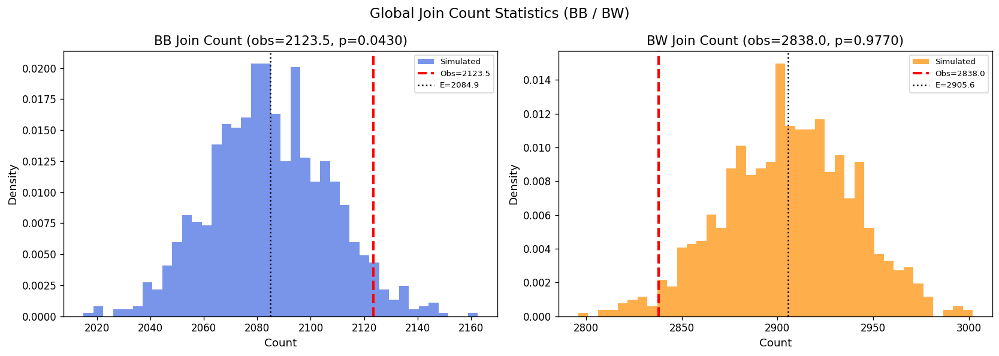

In [48]:
# ── VIZ 22 — BB / BW Join Counts ─────────────────────────────────────────────
z_binary = (y_mag >= np.median(y_mag)).astype(int)
jc = Join_Counts(z_binary, w4)
print(f'BB={jc.bb:.1f} p={jc.p_sim_bb:.4f}  BW={jc.bw:.1f} p={jc.p_sim_bw:.4f}  WW={jc.ww:.1f}')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, sim, obs, mean, pval, color, title in zip(
        axes,
        [jc.sim_bb, jc.sim_bw],
        [jc.bb,     jc.bw],
        [jc.mean_bb, jc.mean_bw],
        [jc.p_sim_bb, jc.p_sim_bw],
        ['royalblue', 'darkorange'],
        ['BB Join Count', 'BW Join Count']):
    ax.hist(sim, bins=40, density=True, color=color, alpha=0.7, label='Simulated')
    ax.axvline(obs,  color='red',   lw=2.5, ls='--', label=f'Obs={obs:.1f}')
    ax.axvline(mean, color='black', lw=1.5, ls=':',  label=f'E={mean:.1f}')
    ax.set_title(f'{title} (obs={obs:.1f}, p={pval:.4f})')
    ax.legend(fontsize=8); ax.set_xlabel('Count'); ax.set_ylabel('Density')

plt.suptitle('Global Join Count Statistics (BB / BW)', fontsize=14)
plt.tight_layout()
save_fig('viz22_join_counts.png')
plt.show()

Sig. local BB clusters: 12
  Saved → Images/viz23_local_bb.png


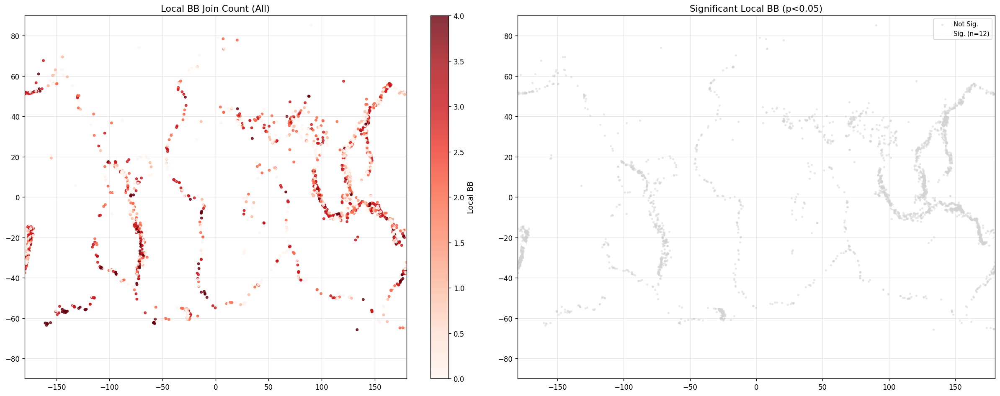

In [49]:
# ── VIZ 23 — Local BB Join Count (Cliff-Ord 1973) ────────────────────────────
W_mat    = w4.sparse.toarray()
z        = z_binary.astype(float)
local_bb = z * (W_mat @ z)    # non-zero only where Z(si)=1

np.random.seed(42)
n_perms = 500
local_bb_perms = np.zeros((n_perms, len(z)))
for k in range(n_perms):
    zp = np.random.permutation(z)
    local_bb_perms[k] = zp * (W_mat @ zp)
p_local_bb = np.mean(local_bb_perms >= local_bb[np.newaxis,:], axis=0)

gdf_s['local_bb']     = local_bb
gdf_s['p_local_bb']   = p_local_bb
gdf_s['local_bb_sig'] = (p_local_bb < 0.05) & (z == 1)
print(f'Sig. local BB clusters: {gdf_s["local_bb_sig"].sum()}')

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
for ax, show_all, title in zip(axes, [True, False],
        ['Local BB Join Count (All)', 'Significant Local BB (p<0.05)']):
    if world is not None: world.plot(ax=ax, color='#f0f0f0', edgecolor='#ccc', linewidth=0.4)
    if show_all:
        sc = ax.scatter(gdf_s['longitude'], gdf_s['latitude'],
                        c=gdf_s['local_bb'], cmap='Reds', s=10, alpha=0.8,
                        vmin=0, vmax=gdf_s['local_bb'].quantile(0.95))
        plt.colorbar(sc, ax=ax, label='Local BB')
    else:
        ax.scatter(gdf_s.loc[~gdf_s['local_bb_sig'],'longitude'],
                   gdf_s.loc[~gdf_s['local_bb_sig'],'latitude'],
                   color='lightgray', s=5, alpha=0.4, label='Not Sig.')
        sig = gdf_s[gdf_s['local_bb_sig']]
        ax.scatter(sig['longitude'], sig['latitude'], c=sig['local_bb'],
                   cmap='hot_r', s=30, alpha=0.9, label=f'Sig. (n={len(sig)})', zorder=5)
        ax.legend(fontsize=9)
    ax.set_xlim(-180,180); ax.set_ylim(-90,90)
    ax.set_title(title); ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz23_local_bb.png')
plt.show()

hotspot
Not Sig.    3000
Name: count, dtype: int64
  Saved → Images/viz24_gi_star.png


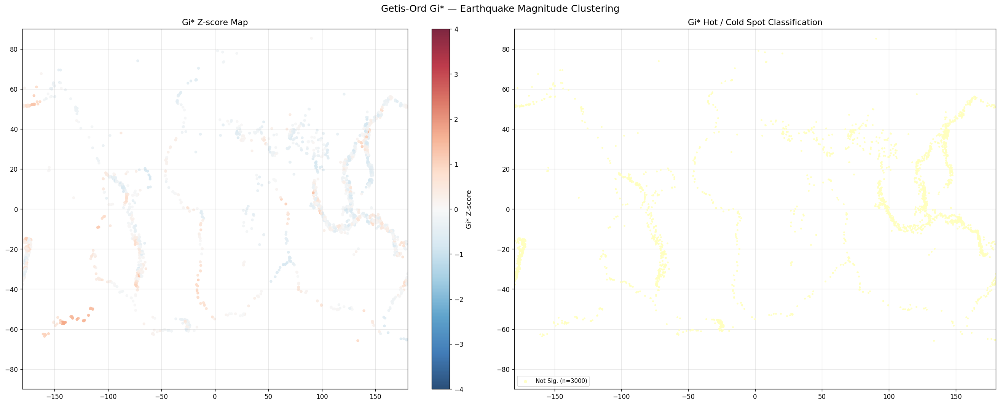

In [50]:
# ── VIZ 24 — Getis-Ord Gi* ───────────────────────────────────────────────────
gi_star = G_Local(y_mag, w8, transform='R', star=True, permutations=999, seed=42)
gdf_s['gi_star_z'] = gi_star.Zs
gdf_s['gi_star_p'] = gi_star.p_sim

gdf_s['hotspot'] = 'Not Sig.'
gdf_s.loc[(gdf_s['gi_star_z'] >  2.576) & (gdf_s['gi_star_p'] < 0.01), 'hotspot'] = 'Hot (p<0.01)'
gdf_s.loc[(gdf_s['gi_star_z'] >  1.960) & (gdf_s['gi_star_p'] < 0.05) & (gdf_s['hotspot']=='Not Sig.'), 'hotspot'] = 'Hot (p<0.05)'
gdf_s.loc[(gdf_s['gi_star_z'] < -2.576) & (gdf_s['gi_star_p'] < 0.01), 'hotspot'] = 'Cold (p<0.01)'
gdf_s.loc[(gdf_s['gi_star_z'] < -1.960) & (gdf_s['gi_star_p'] < 0.05) & (gdf_s['hotspot']=='Not Sig.'), 'hotspot'] = 'Cold (p<0.05)'
print(gdf_s['hotspot'].value_counts())

hs_colors = {'Hot (p<0.01)':'#d73027','Hot (p<0.05)':'#fc8d59',
             'Not Sig.':'#ffffbf','Cold (p<0.05)':'#91bfdb','Cold (p<0.01)':'#4575b4'}

fig, axes = plt.subplots(1, 2, figsize=(22, 9))
ax = axes[0]
if world is not None: world.plot(ax=ax, color='#f0f0f0', edgecolor='#ccc', linewidth=0.4)
sc = ax.scatter(gdf_s['longitude'], gdf_s['latitude'],
                c=gdf_s['gi_star_z'], cmap='RdBu_r', s=12, alpha=0.85, vmin=-4, vmax=4)
plt.colorbar(sc, ax=ax, label='Gi* Z-score')
ax.set_xlim(-180,180); ax.set_ylim(-90,90); ax.set_title('Gi* Z-score Map'); ax.grid(True, alpha=0.3)

ax = axes[1]
if world is not None: world.plot(ax=ax, color='#f0f0f0', edgecolor='#ccc', linewidth=0.4)
for label, color in hs_colors.items():
    sub = gdf_s[gdf_s['hotspot'] == label]
    if len(sub):
        sz = 30 if 'p<0.01' in label else (15 if 'p<0.05' in label else 4)
        ax.scatter(sub['longitude'], sub['latitude'], color=color, s=sz, alpha=0.85,
                   label=f'{label} (n={len(sub)})', zorder=5 if label!='Not Sig.' else 2)
ax.set_xlim(-180,180); ax.set_ylim(-90,90)
ax.set_title('Gi* Hot / Cold Spot Classification')
ax.legend(loc='lower left', fontsize=9, markerscale=2); ax.grid(True, alpha=0.3)
plt.suptitle('Getis-Ord Gi* — Earthquake Magnitude Clustering', fontsize=15)
plt.tight_layout()
save_fig('viz24_gi_star.png')
plt.show()

  Saved → Images/viz25_violin.png


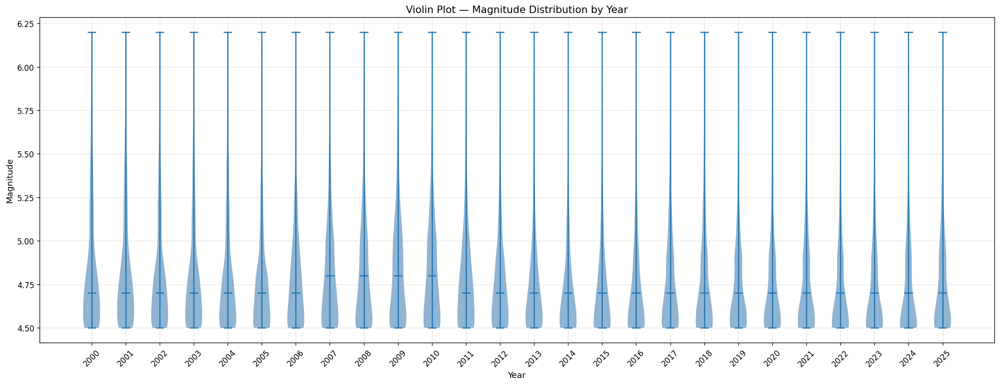

In [51]:
# ── VIZ 25 — Violin Plot by Year ─────────────────────────────────────────────
years_list = sorted(df_clean['year'].unique())
data_by_year = [(yr, df_clean[df_clean['year']==yr]['mag'].dropna().values)
                for yr in years_list if len(df_clean[df_clean['year']==yr]) > 1]

fig, ax = plt.subplots(figsize=(18, 7))
parts = ax.violinplot([d for _, d in data_by_year],
                      positions=range(len(data_by_year)), showmedians=True)
for pc in parts['bodies']: pc.set_facecolor('steelblue'); pc.set_alpha(0.6)
ax.set_xticks(range(len(data_by_year)))
ax.set_xticklabels([str(y) for y, _ in data_by_year], rotation=45)
ax.set_title('Violin Plot — Magnitude Distribution by Year')
ax.set_xlabel('Year'); ax.set_ylabel('Magnitude'); ax.grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz25_violin.png')
plt.show()

  Saved → Images/viz26_depth_hexbin.png


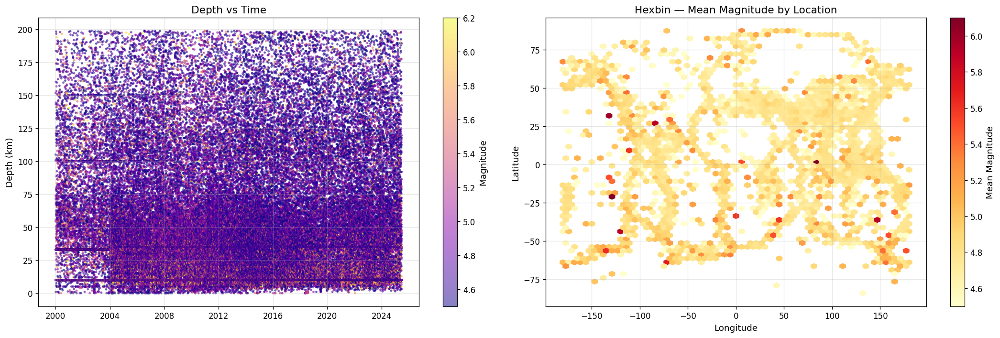

In [52]:
# ── VIZ 26 — Depth vs Time & Hexbin ──────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
sc = axes[0].scatter(df_clean['time'], df_clean['depth'],
                     c=df_clean['mag'], cmap='plasma', s=4, alpha=0.5)
plt.colorbar(sc, ax=axes[0], label='Magnitude')
axes[0].set_title('Depth vs Time'); axes[0].set_ylabel('Depth (km)')
axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y')); axes[0].grid(True, alpha=0.3)

hb = axes[1].hexbin(df_clean['longitude'], df_clean['latitude'],
                    C=df_clean['mag'], gridsize=60, cmap='YlOrRd', reduce_C_function=np.mean)
plt.colorbar(hb, ax=axes[1], label='Mean Magnitude')
axes[1].set_title('Hexbin — Mean Magnitude by Location')
axes[1].set_xlabel('Longitude'); axes[1].set_ylabel('Latitude'); axes[1].grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz26_depth_hexbin.png')
plt.show()

  Saved → Images/viz27_gutenberg_richter.png


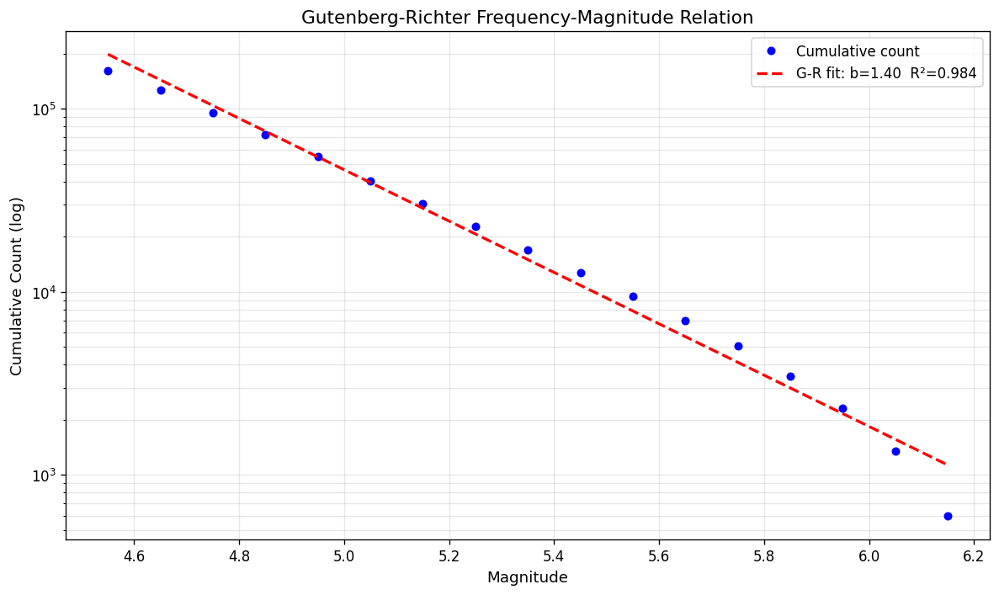

b-value = 1.402


In [53]:
# ── VIZ 27 — Gutenberg-Richter ───────────────────────────────────────────────
mag_bins_gr = np.arange(df_clean['mag'].min(), df_clean['mag'].max()+0.1, 0.1)
counts_gr, edges_gr = np.histogram(df_clean['mag'], bins=mag_bins_gr)
cumul_gr = np.cumsum(counts_gr[::-1])[::-1]
mids_gr  = (edges_gr[:-1] + edges_gr[1:]) / 2

mask_gr = cumul_gr > 0
slope, intercept, r_val, _, _ = stats.linregress(mids_gr[mask_gr], np.log10(cumul_gr[mask_gr]))

fig, ax = plt.subplots(figsize=(10, 6))
ax.semilogy(mids_gr, cumul_gr, 'bo', ms=5, label='Cumulative count')
ax.semilogy(mids_gr[mask_gr], 10**(intercept + slope*mids_gr[mask_gr]), 'r--', lw=2,
            label=f'G-R fit: b={-slope:.2f}  R²={r_val**2:.3f}')
ax.set_xlabel('Magnitude'); ax.set_ylabel('Cumulative Count (log)')
ax.set_title('Gutenberg-Richter Frequency-Magnitude Relation')
ax.legend(); ax.grid(True, which='both', alpha=0.3)
plt.tight_layout()
save_fig('viz27_gutenberg_richter.png')
plt.show()
print(f'b-value = {-slope:.3f}')

  Saved → Images/viz28_periodogram.png


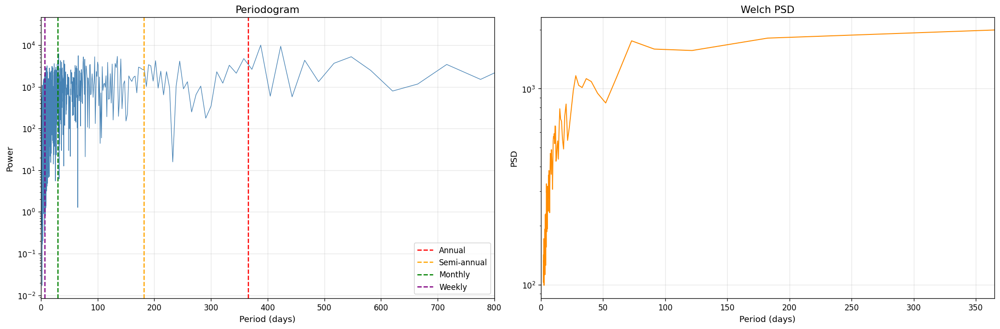

In [54]:
# ── VIZ 28 — Periodogram & Welch PSD ─────────────────────────────────────────
daily_count = daily['count'].reindex(
    pd.date_range(daily.index[0], daily.index[-1], freq='D'), fill_value=0
)
fs = 1.0
freqs_p, power_p = periodogram(daily_count.values, fs=fs)
freqs_w, power_w = welch(daily_count.values, fs=fs, nperseg=min(365, len(daily_count)//4))
with np.errstate(divide='ignore'):
    period_p = np.where(freqs_p > 0, 1.0/freqs_p, np.inf)
    period_w = np.where(freqs_w > 0, 1.0/freqs_w, np.inf)

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
axes[0].semilogy(period_p[1:], power_p[1:], color='steelblue', lw=0.8)
for val, color, label in [(365.25,'red','Annual'),(182,'orange','Semi-annual'),
                           (30,'green','Monthly'),(7,'purple','Weekly')]:
    axes[0].axvline(val, color=color, ls='--', lw=1.5, label=label)
axes[0].set_xlim(0, min(800, period_p[1:].max()))
axes[0].set_xlabel('Period (days)'); axes[0].set_ylabel('Power')
axes[0].set_title('Periodogram'); axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].semilogy(period_w[1:], power_w[1:], color='darkorange', lw=1.2)
axes[1].set_xlim(0, min(800, period_w[1:].max()))
axes[1].set_xlabel('Period (days)'); axes[1].set_ylabel('PSD')
axes[1].set_title('Welch PSD'); axes[1].grid(True, alpha=0.3)
plt.tight_layout()
save_fig('viz28_periodogram.png')
plt.show()

  Saved → Images/viz29_cumul_energy.png


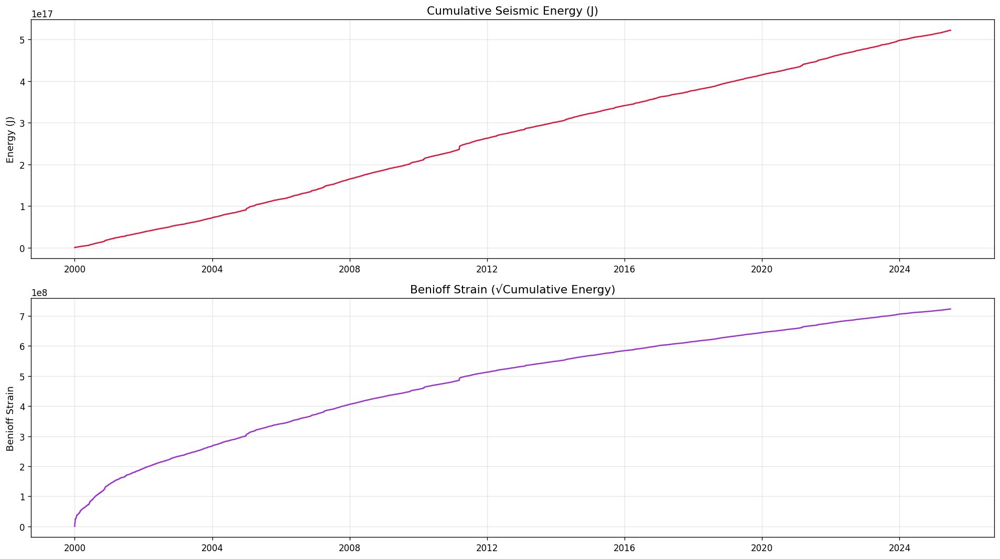

In [55]:
# ── VIZ 29 — Cumulative Seismic Energy & Benioff Strain ──────────────────────
df_sorted = df_clean.sort_values('time').copy()
df_sorted['cumul_energy']   = df_sorted['energy_J'].cumsum()
df_sorted['benioff_strain'] = np.sqrt(df_sorted['cumul_energy'])

fig, axes = plt.subplots(2, 1, figsize=(16, 9))
axes[0].plot(df_sorted['time'], df_sorted['cumul_energy'],   color='crimson',    lw=1.5)
axes[0].set_title('Cumulative Seismic Energy (J)'); axes[0].set_ylabel('Energy (J)')
axes[0].grid(True, alpha=0.3); axes[0].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
axes[1].plot(df_sorted['time'], df_sorted['benioff_strain'], color='darkorchid', lw=1.5)
axes[1].set_title('Benioff Strain (√Cumulative Energy)'); axes[1].set_ylabel('Benioff Strain')
axes[1].grid(True, alpha=0.3); axes[1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
plt.tight_layout()
save_fig('viz29_cumul_energy.png')
plt.show()

  Saved → Images/viz30_omori.png


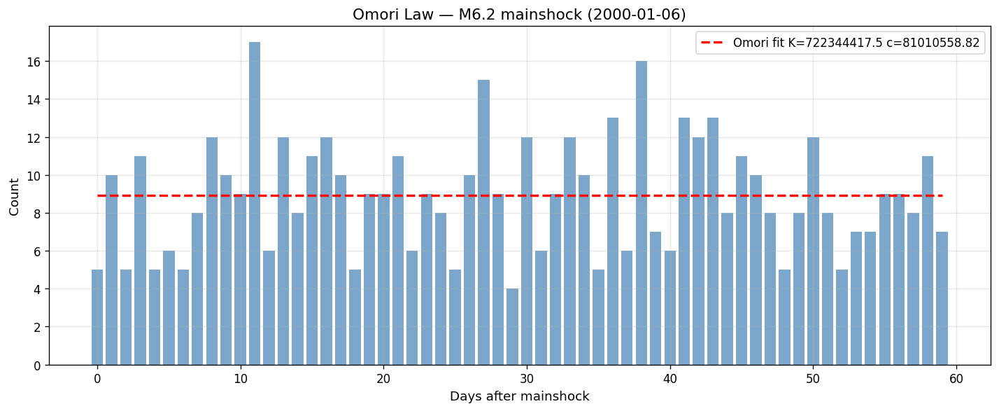

In [56]:
# ── VIZ 30 — Omori Law Aftershock Decay ──────────────────────────────────────
main_idx  = df_clean['mag'].idxmax()
main_time = df_clean.loc[main_idx, 'time']
main_mag  = df_clean.loc[main_idx, 'mag']

aftershocks = df_clean[
    (df_clean['time'] > main_time) &
    (df_clean['time'] <= main_time + pd.Timedelta(days=60))
].copy()
aftershocks['days_after'] = (aftershocks['time'] - main_time).dt.total_seconds() / 86400

if len(aftershocks) > 5:
    day_counts = aftershocks.groupby(aftershocks['days_after'].astype(int))['mag'].count()
    fig, ax = plt.subplots(figsize=(12, 5))
    ax.bar(day_counts.index, day_counts.values, color='steelblue', alpha=0.7)
    t_vals = day_counts.index.values + 1
    n_vals = day_counts.values.astype(float)
    def omori(t, K, c): return K / (t + c)
    try:
        popt, _ = curve_fit(omori, t_vals, n_vals, p0=[100, 1], maxfev=5000)
        t_fit = np.linspace(1, t_vals.max(), 200)
        ax.plot(t_fit-1, omori(t_fit, *popt), 'r--', lw=2,
                label=f'Omori fit K={popt[0]:.1f} c={popt[1]:.2f}')
        ax.legend()
    except Exception as e:
        print(f'Omori fit failed: {e}')
    ax.set_xlabel('Days after mainshock'); ax.set_ylabel('Count')
    ax.set_title(f'Omori Law — M{main_mag:.1f} mainshock ({main_time.date()})')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    save_fig('viz30_omori.png')
    plt.show()
else:
    print(f'Only {len(aftershocks)} aftershocks in 60-day window — skipping.')

---
## 💾 Save Preprocessed Dataset (`dataset_preprocessed.csv`)


In [59]:
# ── Build preprocessed dataframe ──────────────────────────────────────────────
df_preprocessed = df_clean.copy()

# Monthly decomposition components → align by period
decomp_df = pd.DataFrame({
    'trend_component'    : decomp_add.trend,
    'seasonal_component' : decomp_add.seasonal,
    'residual_component' : decomp_add.resid,
    'deseasonalised'     : deseasonalised,
    'detrended_lin'      : pd.Series(detrended_lin,  index=ts_count.index),
    'detrended_poly'     : pd.Series(detrended_poly, index=ts_count.index),
    'detrended_diff'     : pd.Series(detrended_diff, index=ts_count.index),
}, index=ts_count.index)
decomp_df.index = decomp_df.index.to_period('M')
decomp_df.index.name = 'period_M'                          # ← name the index explicitly

monthly_pp = monthly[['count','mag_mean','mag_max','depth_mean','energy_sum']].copy()
monthly_pp.index = monthly_pp.index.to_period('M')
monthly_pp.index.name = 'period_M'                         # ← name the index explicitly
monthly_pp.columns = ['monthly_count','monthly_mag_mean','monthly_mag_max',
                       'monthly_depth_mean','monthly_energy_sum']

df_preprocessed['period_M'] = df_preprocessed['time'].dt.to_period('M')

df_preprocessed = (
    df_preprocessed
    .merge(monthly_pp.reset_index(),   on='period_M', how='left')   # ← no rename needed now
    .merge(decomp_df.reset_index(),    on='period_M', how='left')
)

# Spatial labels — match by rounded lat/lon
sp_cols = ['latitude','longitude','lisa_label','hotspot',
           'gi_star_z','gi_star_p','local_bb','p_local_bb','local_bb_sig']
sp = gdf_s[sp_cols].copy()
sp['lat_r'] = sp['latitude'].round(2)
sp['lon_r'] = sp['longitude'].round(2)
df_preprocessed['lat_r'] = df_preprocessed['latitude'].round(2)
df_preprocessed['lon_r'] = df_preprocessed['longitude'].round(2)
df_preprocessed = df_preprocessed.merge(
    sp.drop(columns=['latitude','longitude']).drop_duplicates(['lat_r','lon_r']),
    on=['lat_r','lon_r'], how='left'
)
df_preprocessed.drop(columns=['period_M','lat_r','lon_r'], inplace=True, errors='ignore')

# Convert any Period columns to string for CSV serialisation
# Convert any Period columns to string for CSV serialisation
for col in df_preprocessed.columns:
    if hasattr(df_preprocessed[col], 'dt') and hasattr(df_preprocessed[col].dt, 'freqstr'):
        try:
            df_preprocessed[col] = df_preprocessed[col].astype(str)
        except Exception:
            pass

out_path = 'dataset_preprocessed.csv'
df_preprocessed.to_csv(out_path, index=False)

print('✅ Preprocessed dataset saved →', out_path)
print(f'   Shape   : {df_preprocessed.shape}')
print(f'   Columns : {list(df_preprocessed.columns)}')

✅ Preprocessed dataset saved → dataset_preprocessed.csv
   Shape   : (162338, 52)
   Columns : ['time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'nst', 'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type', 'horizontalError', 'depthError', 'magError', 'magNst', 'status', 'locationSource', 'magSource', 'is_outlier', 'year', 'month', 'month_name', 'dayofyear', 'dayofweek', 'hour', 'quarter', 'week', 'date', 'energy_J', 'monthly_count', 'monthly_mag_mean', 'monthly_mag_max', 'monthly_depth_mean', 'monthly_energy_sum', 'trend_component', 'seasonal_component', 'residual_component', 'deseasonalised', 'detrended_lin', 'detrended_poly', 'detrended_diff', 'lisa_label', 'hotspot', 'gi_star_z', 'gi_star_p', 'local_bb', 'p_local_bb', 'local_bb_sig']


In [60]:
# ── Final summary ─────────────────────────────────────────────────────────────
imgs = sorted(glob.glob(os.path.join(IMG_DIR, '*.png')))
print('=' * 65)
print(f'  ANALYSIS COMPLETE')
print('=' * 65)
print(f'  Earthquakes analysed : {len(df_clean):,}')
print(f'  Date range           : {df_clean["time"].min().date()} → {df_clean["time"].max().date()}')
print(f'  Magnitude range      : {df_clean["mag"].min():.1f} – {df_clean["mag"].max():.1f}')
print(f"  Moran's I            : {moran_global.I:.4f}  (p={moran_global.p_sim:.4f})")
print(f"  Geary's C            : {geary_global.C:.4f}  (p={geary_global.p_sim:.4f})")
print(f'  LISA HH clusters     : {(gdf_s["lisa_label"]=="High-High").sum()}')
print(f'  BB Join Count        : {jc.bb:.1f}  (p={jc.p_sim_bb:.4f})')
print(f'  Images saved         : {len(imgs)}  →  {IMG_DIR}/')
print(f'  Preprocessed CSV     : dataset_preprocessed.csv')
print('=' * 65)
for p in imgs:
    print(' ', p)

  ANALYSIS COMPLETE
  Earthquakes analysed : 162,338
  Date range           : 2000-01-01 → 2025-06-24
  Magnitude range      : 4.5 – 6.2
  Moran's I            : 0.0439  (p=0.0010)
  Geary's C            : 0.9424  (p=0.0010)
  LISA HH clusters     : 99
  BB Join Count        : 2123.5  (p=0.0430)
  Images saved         : 31  →  Images/
  Preprocessed CSV     : dataset_preprocessed.csv
  Images/viz00_outlier_removal.png
  Images/viz01_raw_timeseries.png
  Images/viz02_rolling_stats.png
  Images/viz03_additive_decomp.png
  Images/viz04_multiplicative_decomp.png
  Images/viz05_stl_decomp.png
  Images/viz06_detrending.png
  Images/viz07_deseasonalised.png
  Images/viz08_seasonal_plots.png
  Images/viz09_seasonal_subseries.png
  Images/viz10_lag_plots.png
  Images/viz11_acf_pacf.png
  Images/viz12_acf_residuals.png
  Images/viz13_smoothing.png
  Images/viz14_heatmaps.png
  Images/viz15_corr_heatmap.png
  Images/viz16_kde.png
  Images/viz17_pairplot.png
  Images/viz18_tsne.png
  Images/viz19_